<a href="https://colab.research.google.com/github/5aurabhpathak/semantic-segmentation/blob/main/road_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Road segmentation from satellite imagery
&copy; Saurabh Pathak. 2021. All code belongs to me.
I am using [google colab](https://colab.research.google.com) environment. If you're viewing it somewhere else, consider using this publicly accessible [link](https://colab.research.google.com/drive/1K2Aa_nhZYE2KpX-PtfVefWSUNB7Xhg-h?usp=sharing) where it can be executed directly by colab.

#### TL; DR

*   No resizing. Instead tiling images into small regions to preserve fine details
*   Model: smaller U-Net architecture (17k params only compared to over 2million of full U-Net) - Loss: weighted binary crossentropy (since imbalanced dataset)
*  Performence on test set
    +  Precision: .68
    +  Recall: .70
    +  IOU: .94
    +  Acc: .93

## Data exploration

### Load data


In [ ]:
# For me only
# to save load data to my folder on my google drive during development of this solution
# from google.colab import drive
# drive.mount('/content/drive')

# For you this cell will download the folder on my drive to this colab machine which contains my soltuion
# and then it will download the dataset from kaggle which I pre-downloaded to my drive to avoid tokens
# you can instead download from kaggle also but you will have to create a token for your kaggle user
! gdown --id 1gJhcrwiB6-piWNUQ98jc8xdGcysDMgXY -O saurabh_solution_data.zip
! gdown --id 1Xz2MJCLXiA5f7MoZnTOIE9rCv2MAcnPW -O massachusetts-roads-dataset.zip

Downloading...
From: https://drive.google.com/uc?id=1gJhcrwiB6-piWNUQ98jc8xdGcysDMgXY
To: /content/saurabh_solution_data.zip
15.1MB [00:00, 132MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Xz2MJCLXiA5f7MoZnTOIE9rCv2MAcnPW
To: /content/massachusetts-roads-dataset.zip
5.07GB [00:45, 112MB/s]


In [ ]:
# For me only. I just need to unzip the data on my mounted drive
# ! unzip -q /content/drive/MyDrive/roads_dataset/massachusetts-roads-dataset.zip
# ! rm -rf road_segmentation_ideal

# For you. Unzip the downloaded dataset and my solution folder
! unzip -q massachusetts-roads-dataset.zip
! unzip -q saurabh_solution_data.zip
! mv /content/content/drive/MyDrive/roads_dataset/saurabh_pathak_solution .
! rm -rf /content/content

In [ ]:
train_data_dir = 'road_segmentation_ideal/training'
test_data_dir = 'road_segmentation_ideal/testing'

In [ ]:
! ls -1 $train_data_dir/input | wc -l
! ls -1 $train_data_dir/output | wc -l

1105
804


In [ ]:
! ls -1 $test_data_dir/input | wc -l
! ls -1 $test_data_dir/output | wc -l

13
13


Training input directory has more images than training output directory. Test data mapping counts look okay.
### Cleaning
We will remove the files with no output mappings and vice-versa. In doing so, we will also keep a data structure to record sizes of individual images in input and output folders. We will also chuck out images whose input and output shapes do not match. This often indicates some issue in mapping or wrong mapping. We compare only the first two dimensions, ignoring the number of channels. They are allowed to differ. One can further investigate the differences in input to output image sizes but it is beyond the scope of this work for now as I would like to keep it simple for the time being.

In [ ]:
import os, numpy as np
from collections import namedtuple
from PIL import Image

Item = namedtuple('Item', 'input_image_size, output_image_size')

def clean(data_path):
  """remove files with no input-output mapping"""
  info = []
  files = os.listdir(os.path.join(data_path, 'input'))
  for filename in files:
    if not os.path.isfile(os.path.join(data_path, 'output', filename)):
      os.remove(os.path.join(data_path, 'input', filename))

  files = os.listdir(os.path.join(data_path, 'output'))
  for filename in files:
    if not os.path.isfile(os.path.join(data_path, 'input', filename)):
      os.remove(os.path.join(data_path, 'output', filename))

    im_in = Image.open(os.path.join(data_path, 'input', filename))
    im_out = Image.open(os.path.join(data_path, 'output', filename))

    im_in_size = np.asarray(im_in).shape
    im_out_size = np.asarray(im_out).shape

    if im_in_size[:2] != im_out_size[:2]:
      os.remove(os.path.join(data_path, 'input', filename))
      os.remove(os.path.join(data_path, 'output', filename))

    info.append(Item(im_in_size, im_out_size))
  
  return info

In [ ]:
info_train = clean(train_data_dir)
info_test = clean(test_data_dir)

In [ ]:
! ls -1 $train_data_dir/input | wc -l
! ls -1 $train_data_dir/output | wc -l

804
804


Good! It looks like we are able to keep all 804 images which have mapping. Only those images from training input which didn't have a mapping was dropped. Means we should have equal input to output shapes as well as all 804 images seem to have passed the shape equality criteria.

### Random visualization
We want to look at some samples. So the below function can be executed multiple times. Each time it selects a random image and its output to visualize.

In [ ]:
from matplotlib import pyplot as plt

def visualize(data_path):
  """random visualization of data"""
  files = os.listdir(os.path.join(data_path, 'input'))
  choice = np.random.choice(files)
  im_in = Image.open(os.path.join(data_path, 'input', choice))
  im_out = Image.open(os.path.join(data_path, 'output', choice))

  plt.figure(figsize=(20,10))
  plt.subplot(121)
  plt.imshow(im_in)
  plt.axis('off')
  plt.title('Input', fontweight='bold')

  plt.subplot(122)
  plt.imshow(im_out)
  plt.axis('off')
  plt.title('Output', fontweight='bold')
  plt.tight_layout()
  plt.show()

  print('im_in_details:\nsize:', im_in.size, '\nmode:', im_in.mode)
  print('im_out_details:\nsize:', im_out.size, '\nmode:', im_out.mode)

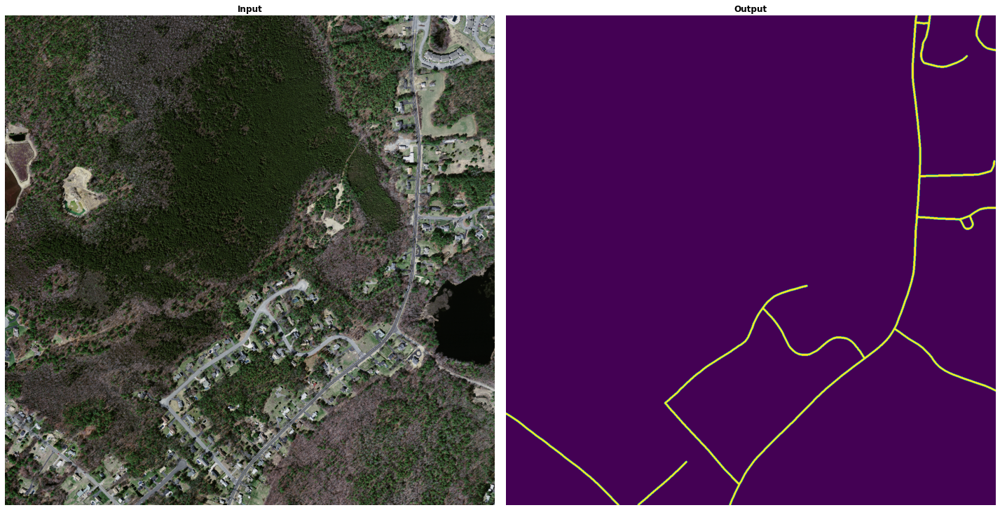

im_in_details:
size: (1500, 1500) 
mode: RGB
im_out_details:
size: (1500, 1500) 
mode: L


In [ ]:
visualize(train_data_dir)

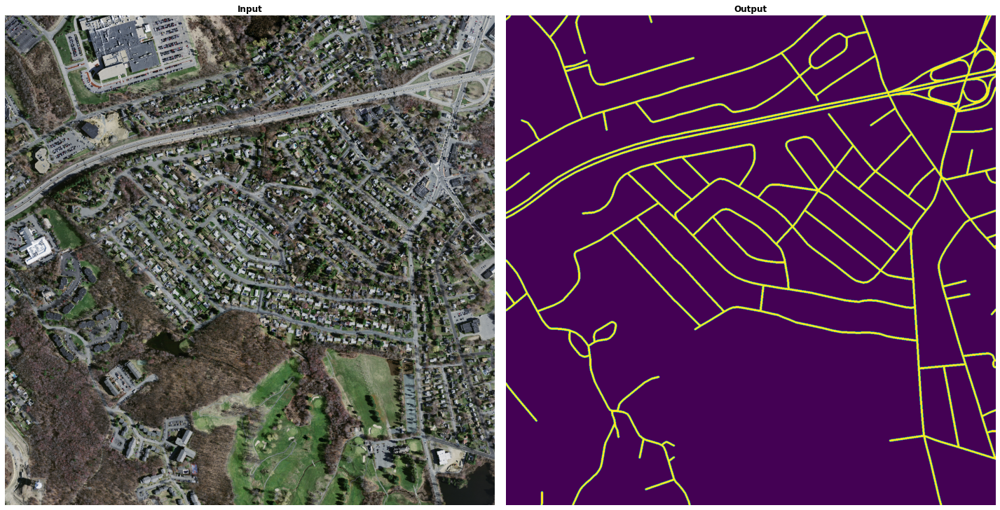

im_in_details:
size: (1500, 1500) 
mode: RGB
im_out_details:
size: (1500, 1500) 
mode: L


In [ ]:
visualize(test_data_dir)

A revelation from staring at a few satellite images is that roads are not clearly visible most of the time due to small area they take on the map. Furthermore, they are difficult to sometime identify even visually due to obscurity from other map features such as trees, buildings etc. Samller, narrower roads tend to blend with the background easily when viewed from above. This makes this task of detecting roads very challenging.

Another observation is that there seems to be noise in some input images (white out) as seen in a random example above.

After looking at a few random images, it appears that images have 1500X1500 resolution. Let's verify if all images are 1500x1500 using info structure we created earlier.

In [ ]:
all([item.input_image_size == (1500, 1500, 3) for item in info_train]) and \
all([item.output_image_size == (1500, 1500) for item in info_train]) and \
all([item.input_image_size == (1500, 1500, 3) for item in info_test]) and \
all([item.output_image_size == (1500, 1500) for item in info_test])

True

This is good news as it helps in keeping things simple as we will see soon.

### Preprocessing
Since images are pretty large (1500x1500), we would like to reduce the size work with smaller images. Larger images are less amenable to vision modelling specially with deep learning techniques. Since I have seen that roads are pretty minute features in an image already, reducing the size of the image will hurt our goal of road detection. But there is another possibility.

#### Approach
**The satellite images can be tiled without losing road semantics.**

*This means that instead of resizing the image, we can tile our 1500x1500 image into say 25 images each of 300x300 size. This will preserve the resolution, and will preserve the details of any road features which hopefully will be descernible to our aspiring model later on.*

So let's do this. Note that the fact that we know all images to be of 1500x1500 allows us to write simpler tiling logic. Were all images of different sizes, the tiling logic would have been much more complicated. 

In [ ]:
! mkdir $train_data_dir/input/data
! mkdir $train_data_dir/output/data
! mkdir $test_data_dir/input/data
! mkdir $test_data_dir/output/data

In [ ]:
from concurrent.futures import ProcessPoolExecutor, as_completed

def run_parallel(data_path, filename):
  im_in = Image.open(os.path.join(data_path, 'input', filename))
  im_out = Image.open(os.path.join(data_path, 'output', filename))
  im_in = np.asarray(im_in)
  im_out = np.asarray(im_out)

  i, j, k = 0, 0, 0
  for i in range(0, 1500, 300):
    for j in range(0, 1500, 300):
      new_filename = f'{k}_{filename}'

      small_im_in = Image.fromarray(im_in[i:i+300, j:j+300])
      small_im_in.save(os.path.join(data_path, 'input/data', new_filename))

      small_im_out = Image.fromarray(im_out[i:i+300, j:j+300])
      small_im_out.save(os.path.join(data_path, 'output/data', new_filename))
      k += 1

def divide_dataset(data_path):
  """divide each large input and corresponding output image of (1500, 1500) into
     25 smaller images of (300, 300)"""
  files = [x for x in os.listdir(os.path.join(data_path, 'input'))
           if not os.path.isdir(os.path.join(data_path, 'input', x))]
  count = 0
  with ProcessPoolExecutor(max_workers=4) as executor:
    futures = [executor.submit(run_parallel, data_path, filename) for filename in files]

    for n, future in enumerate(as_completed(futures)):
      count += 25
      print('\r', n+1, 'big files processed.', count, 'small files generated.',
          end='')

In [ ]:
# ! rm -rf $train_data_dir/input/data/*
divide_dataset(train_data_dir)

 804 big files processed. 20100 small files generated.

In [ ]:
# ! rm -rf $test_data_dir/input/data/*
divide_dataset(test_data_dir)

 13 big files processed. 325 small files generated.

In [ ]:
! ls -1 $train_data_dir/input/data | wc -l
! ls -1 $test_data_dir/input/data | wc -l

20100
325


So we have generated 20k odd training images of 300x300 size which is a good amount of raw training data. We have done so without loosing any of the fine details required for a good road segmentation.

We are now ready to define the so-called X, Y pairs for our training task. For this I'll zip together two keras ImageDataGenerator instances. Since this is an instance of a forground and background image segmentation task, our output will be a binary mask showing roads and input will be an RGB image. These will be provided by respective generators.

We will use a few augmentations. Though not as many as I would have liked here, due to computational resource constraints. I have commented out most but I would have use them had I access to a powerful machine. Note the validation split is 10% which is 2k images, suficient for validation.

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

im_width, im_height = 256, 256
batch_size = 32

# we create two instances with the same arguments
data_gen_args = dict(rescale=1./255,
                     horizontal_flip=True,
                     vertical_flip=True,
                    #  rotation_range=90,
                    #  width_shift_range=0.1,
                    #  height_shift_range=0.1,
                    #  zoom_range=0.2,
                     validation_split=0.1)

in_img_gen = ImageDataGenerator(**data_gen_args)
out_img_gen = ImageDataGenerator(**data_gen_args)

# Provide the same seed and keyword arguments to the fit and flow methods
seed = 0

im_in_generator_train = in_img_gen.flow_from_directory(
    os.path.join(train_data_dir, 'input'),
    target_size=(im_height, im_width),
    batch_size=batch_size,
    classes=None,
    class_mode=None,
    subset='training',
    seed=seed)

im_in_generator_valid = in_img_gen.flow_from_directory(
    os.path.join(train_data_dir, 'input'),
    target_size=(im_height, im_width),
    batch_size=batch_size,
    classes=None,
    class_mode=None,
    subset='validation',
    seed=seed)

im_out_generator_train = out_img_gen.flow_from_directory(
    os.path.join(train_data_dir, 'output'),
    target_size=(im_height, im_width),
    batch_size=batch_size,
    color_mode='grayscale',
    classes=None,
    class_mode=None,
    subset='training',
    seed=seed)

im_out_generator_valid = out_img_gen.flow_from_directory(
    os.path.join(train_data_dir, 'output'),
    target_size=(im_height, im_width),
    batch_size=batch_size,
    color_mode='grayscale',
    classes=None,
    class_mode=None,
    subset='validation',
    seed=seed)

# combine generators into one which yields images for input and output
train_generator = zip(im_in_generator_train, im_out_generator_train)

#another for validation
valid_generator = zip(im_in_generator_valid, im_out_generator_valid)

steps_per_epoch = im_in_generator_train.samples // batch_size + int(im_in_generator_train.samples % batch_size != 0)
validation_steps = im_in_generator_valid.samples // batch_size + int(im_in_generator_valid.samples % batch_size != 0)
steps_per_epoch, validation_steps

Found 18090 images belonging to 1 classes.
Found 2010 images belonging to 1 classes.
Found 18090 images belonging to 1 classes.
Found 2010 images belonging to 1 classes.


(566, 63)

## Model

### Approach
We will be using [U-Net](https://arxiv.org/pdf/1505.04597.pdf) architecture -- well, a shallower than original version of U-net to reduce computational expense. The UNet essentially is an advanced form of convolutional autoencoder characterized by skip connections across its encoder-decoder pathway. It has also performed well in image segmentation application in recent years. So let's make one with just a few thousand parameters and see if it works for us too.

In [ ]:
from keras.models import Model
from keras.layers import BatchNormalization, Activation, Dropout, Input, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate

def conv2d_block(input_tensor, name, n_filters, kernel_size=3, batchnorm=True):
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size),
               kernel_initializer='he_normal', padding ='same',
               name=f'{name}/cnv1')(input_tensor)
    if batchnorm:
        x = BatchNormalization(name=f'{name}/b1')(x)
    x = Activation('relu', name=f'{name}/act1')(x)
    
    return x
  
def get_shallower_unet(im_height, im_width, n_filters=16, dropout=0.1, batchnorm=True):
    in_img = Input((im_height, im_width, 3), name='img')

    c1 = conv2d_block(in_img, 'c1', n_filters * 1, kernel_size=3,
                      batchnorm=batchnorm)
    p1 = MaxPooling2D((2, 2), name='p1')(c1)
    p1 = Dropout(dropout, name='d1')(p1)
    
    c2 = conv2d_block(p1, 'c2', n_filters * 2, kernel_size=3,
                      batchnorm=batchnorm)
    p2 = MaxPooling2D((2, 2), name='p2')(c2)
    p2 = Dropout(dropout, name='d2')(p2)
    
    c3 = conv2d_block(p2, 'c3', n_filters * 4, kernel_size=3,
                      batchnorm=batchnorm)
    
    u4 = Conv2DTranspose(n_filters * 2, (3, 3), strides=(2, 2), padding='same',
                         name='u4_deconv')(c3)
    u4 = concatenate([u4, c2], name='u4_concat')
    u4 = Dropout(dropout, name='u4do')(u4)
    c4 = conv2d_block(u4, 'c4', n_filters * 2, kernel_size = 3,
                      batchnorm = batchnorm)
    
    u5 = Conv2DTranspose(n_filters * 1, (3, 3), strides=(2, 2), padding='same',
                         name='u5_deconv')(c4)
    u5 = concatenate([u5, c1], name='u5_concat')
    u5 = Dropout(dropout, name='u5do')(u5)
    c5 = conv2d_block(u5, 'c5', n_filters * 1, kernel_size=3,
                      batchnorm=batchnorm)
    
    outputs = Conv2D(1, (1, 1), activation='sigmoid', name='output')(c5)
    model = Model(inputs=[in_img], outputs=[outputs], name='model')
    return model

Our binary segmentation task is imbalanced in nature, means we have lots of background examples in our data than foreground (road) examples. It seems appropriate to use weighted binary cross entropy loss here.

I'll also define other metrics here as per requirement: IOU for positve class, precision, recall and accuracy.

**Note:** *Due to the class imbalance noted above, I think accuracy as a metric is not so informative. As the reader will probably know, for an imbalanced problem accuracy can be above 90-95% but still the model can be useless. Though it might help sometimes as a sanity check.*

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
c1/cnv1 (Conv2D)                (None, 256, 256, 8)  224         img[0][0]                        
__________________________________________________________________________________________________
c1/b1 (BatchNormalization)      (None, 256, 256, 8)  32          c1/cnv1[0][0]                    
__________________________________________________________________________________________________
c1/act1 (Activation)            (None, 256, 256, 8)  0           c1/b1[0][0]                      
______________________________________________________________________________________________

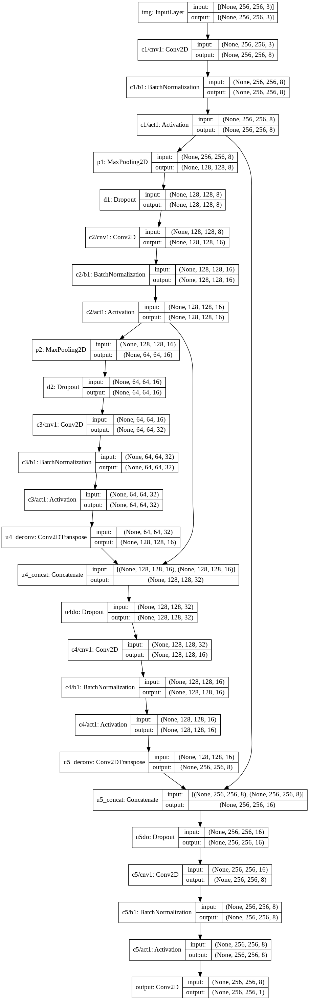

In [ ]:
from keras.metrics import Precision, Recall, MeanIoU
from keras.optimizers import adam_v2
from keras.utils.vis_utils import plot_model
import keras.backend as K
import tensorflow as tf

# Note: keras has an meanIOU metric but it calculates average IOU over both positve
# and negative classes. Here, we're only interested in positive (road) class.
def iou(y_true, y_pred, smooth=1.):
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    union = K.sum(y_true,-1) + K.sum(y_pred,-1) - intersection
    return (intersection + smooth) / ( union + smooth)


def create_weighted_binary_ce(*, alpha):
  def binary_ce(y_true, y_pred):
      y_true = tf.cast(y_true, tf.float32)
      epsilon = K.epsilon()
      y_pred = K.clip(y_pred, epsilon, 1. - epsilon)
      p_t = tf.where(K.equal(y_true, 1.), y_pred, 1. - y_pred)
      alpha_factor = K.ones_like(y_true) * alpha
      alpha_t = tf.where(K.equal(y_true, 1.), alpha_factor, 1. - alpha_factor)
      cross_entropy = -K.log(p_t)

      loss = alpha_t * cross_entropy
      loss = K.mean(K.sum(loss, axis=1))
      return loss
  return binary_ce


tf.compat.v1.reset_default_graph()
model = get_shallower_unet(im_height, im_width, n_filters=8, dropout=0.05, batchnorm=True)
model.compile(optimizer=adam_v2.Adam(learning_rate=0.002),
              loss=create_weighted_binary_ce(alpha=.7),
              metrics=['accuracy', 
                       Precision(name='precision'),
                       Recall(name='recall'),
                       iou])
model.summary()
plot_model(model, show_shapes=True, show_layer_names=True)

In [ ]:
import json
with open('model.json', 'w') as f:
  json.dumps(model.to_json())

So we have a network with less than 20k parameters. Let's train this on our generators.

## Training



In [ ]:
# log dir
save_path = os.path.join('saurabh_pathak_solution', 'wt7_cross_entropy')
os.makedirs(save_path, exist_ok=True)

### Start tensorboard
If appears blank, please make sure save_path is correct and refresh tensorboard to see my charts

In [ ]:
# Do not uncomment below line. Will wipe out previous training stats
# ! rm -rf $save_path/*
%reload_ext tensorboard
%tensorboard --logdir $save_path

<IPython.core.display.Javascript object>

---
### Note:

If you dont want to run the training again (takes several hours on colab GPU) then you can jump directly to evaluation section where I will load my trained weights into the network.

---

### Start training
Using Adam. We'll also start a tensorboard to visualize bathwise as well as epoch progress on all metrics.

In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard

filepath = os.path.join(save_path, 'model.{epoch:02d}-{val_loss:.4f}.h5')

callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint(filepath=filepath, verbose=1,
                    save_best_only=True, save_weights_only=True),
    TensorBoard(log_dir=save_path,
                histogram_freq=0,
                write_graph=False,
                write_images=False,
                write_steps_per_second=False,
                update_freq='batch',
                profile_batch=2,
                embeddings_freq=0,
                embeddings_metadata=None)]

In [ ]:
history = model.fit(train_generator, 
          steps_per_epoch=steps_per_epoch,
          epochs=50,
          shuffle=False, # can be set to False since data generators are already shuffling
          validation_data=valid_generator,
          validation_steps=validation_steps,
          callbacks=callbacks)

Epoch 1/50
566/566 [==============================] - 202s 353ms/step - loss: 27.9365 - accuracy: 0.8984 - precision: 0.2278 - recall: 0.3935 - iou: 0.8400 - val_loss: 18.1270 - val_accuracy: 0.9360 - val_precision: 0.3988 - val_recall: 0.5749 - val_iou: 0.9215

Epoch 00001: val_loss improved from inf to 18.12696, saving model to learning/model.01-18.1270.h5
Epoch 2/50
566/566 [==============================] - 192s 339ms/step - loss: 16.4048 - accuracy: 0.9500 - precision: 0.5255 - recall: 0.5553 - iou: 0.9350 - val_loss: 14.4504 - val_accuracy: 0.9589 - val_precision: 0.5759 - val_recall: 0.5690 - val_iou: 0.9540

Epoch 00002: val_loss improved from 18.12696 to 14.45043, saving model to learning/model.02-14.4504.h5
Epoch 3/50
566/566 [==============================] - 192s 339ms/step - loss: 14.9039 - accuracy: 0.9544 - precision: 0.5562 - recall: 0.5998 - iou: 0.9439 - val_loss: 13.9183 - val_accuracy: 0.9561 - val_precision: 0.5442 - val_recall: 0.6407 - val_iou: 0.9464

Epoch 0000

Plots of all the metrics are available in the tensorboard instance above but I will replot epochwise metrics here for convinience. If you are interested in batchwise metrics please refer to the tensorboard.


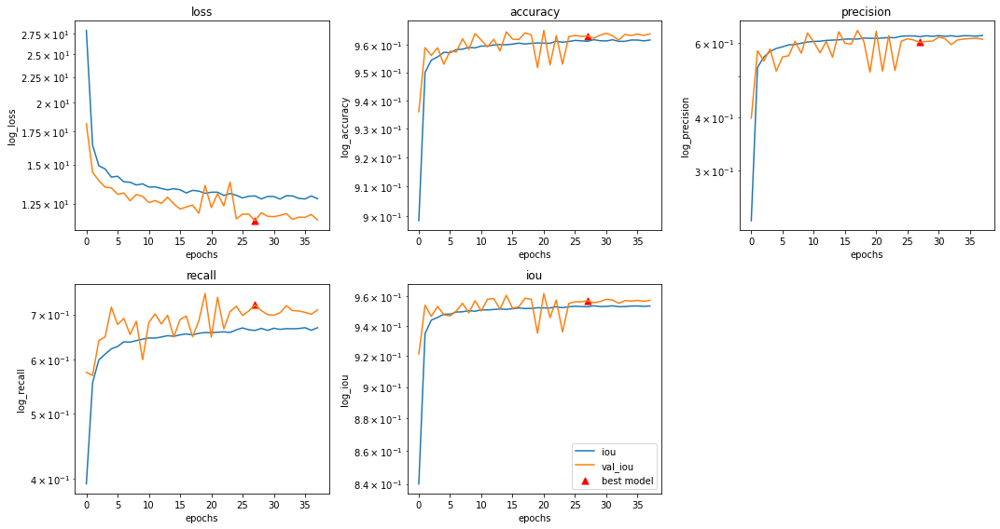

In [ ]:
def plot_metric(res, metric, mark_epoch, *, logy=False):
  val_metric = f'val_{metric}'
  plt.title(metric)
  func = plt.plot if not logy else plt.semilogy
  ylabel = metric if not logy else f'log_{metric}'
  func(res.history[metric], label=metric)
  func(res.history[val_metric], label=val_metric)
  plt.scatter(mark_epoch,
              res.history[val_metric][mark_epoch],
              marker='^', color='r', s=50, label='best model')
  plt.xlabel('epochs')
  plt.ylabel(ylabel)

best_epoch = np.argmin(history.history['val_loss'])
nr, nc = 2, 3
fig, axes = plt.subplots(nr, nc, sharex=True, figsize=(15, 8))
for i, metric in enumerate(model.metrics_names):
  plt.subplot(nr, nc, i+1)
  plot_metric(history, metric, best_epoch, logy=True)

fig.delaxes(axes[1][2])
plt.tight_layout()
plt.legend()

We can see that the training has converged. I have also marked the position of best model configuration in the respective plots.

#### Load best model weights
The naming convention I have used in the model checkpoint will help me automate picking up the right file

In [ ]:
best_weights = f'model.{best_epoch+1:02d}-{history.history["val_loss"][best_epoch]:.4f}.h5'
model.load_weights(os.path.join(save_path, best_weights))

## Evaluation on test set
---
Note: If you haven't done training, you need to load my weights. Uncomment and run below cell first

In [ ]:
# all_models = [x for x in os.listdir(save_path) if x.endswith('.h5')]
# best_epoch = np.argmax([int(x.split('.')[1].split('-')[0]) for x in all_models])
# best_model = all_models[best_epoch]
# best_weights = os.path.join(save_path, best_model)
# model.load_weights(best_weights)
# print("loaded best weights from saurabh's data:", best_weights)

Let's load and prepare test set data for inference

In [ ]:
def load_test_data(data_path, resize_width, resize_height):
  X_test, Y_test = [], []
  files = [x for x in os.listdir(os.path.join(data_path, 'input/data'))
           if not os.path.isdir(os.path.join(data_path, 'input/data', x))]
  for filename in files:
    im_in = Image.open(os.path.join(data_path, 'input/data', filename))
    im_out = Image.open(os.path.join(data_path, 'output/data', filename))
    X_test.append(np.asarray(im_in.resize((resize_width, resize_height))))
    Y_test.append(np.asarray(im_out.resize((resize_width, resize_height))))

  return np.asarray(X_test), np.asarray(Y_test)[:, :, :, np.newaxis]

In [ ]:
X_test, Y_test = load_test_data(test_data_dir, im_width, im_height)
X_test.shape, Y_test.shape

((325, 256, 256, 3), (325, 256, 256, 1))

In [ ]:
XX = X_test / 255.
YY = Y_test / 255.

Evaluate on test images

In [ ]:
metrics = model.evaluate(XX, YY, return_dict=True)

11/11 [==============================] - 2s 98ms/step - loss: 14.4889 - accuracy: 0.9289 - precision: 0.6812 - recall: 0.6994 - iou: 0.9408


In [ ]:
metrics

{'accuracy': 0.9289054870605469,
 'iou': 0.9408066272735596,
 'loss': 14.488860130310059,
 'precision': 0.6812070608139038,
 'recall': 0.6994408369064331}

As we can see the results are pretty good for the test set. Next we will save the prediction images on test set to a directory.

In [ ]:
def save_predictions(data_path, out_dir, X):
  os.makedirs(out_dir, exist_ok=True)
  files = [x for x in os.listdir(os.path.join(data_path, 'input/data'))
           if not os.path.isdir(os.path.join(data_path, 'input/data', x))]
  Y_pred = model.predict(X)
  Y_pred = (np.around(Y_pred) * 255.).squeeze().astype('uint8')
  for filename, yp in zip(files, Y_pred):
    im_out = Image.fromarray(yp)
    im_out = im_out.resize((300, 300))
    im_out.save(os.path.join(out_dir, filename))

In [ ]:
out_dir = os.path.join(save_path, 'predictions')
save_predictions(test_data_dir, out_dir, XX)

Some of the predictions can be viewed against the ground truth at random below.

In [ ]:
def visualize_predictions(data_path, prediction_path, n=5):
  files = [x for x in os.listdir(os.path.join(data_path, 'input/data'))
           if not os.path.isdir(os.path.join(data_path, 'input/data', x))]

  plt.figure(figsize=(15, n*5))
  for row in range(n):
    choice = np.random.choice(files)
    im_in = Image.open(os.path.join(data_path, 'input/data', choice))
    im_gt = Image.open(os.path.join(data_path, 'output/data', choice))
    im_pred = Image.open(os.path.join(prediction_path, choice))
    plt.subplot(n, 3, 3*row+1)
    plt.imshow(im_in)
    plt.axis('off')
    if not row:
      plt.title('Input', fontweight='bold', fontsize=25)

    plt.subplot(n, 3, 3*row+2)
    plt.imshow(im_pred)
    plt.axis('off')
    if not row:
      plt.title('Prediction', fontweight='bold', fontsize=25)

    plt.subplot(n, 3, 3*row+3)
    plt.imshow(im_gt)
    plt.axis('off')
    if not row:
      plt.title('Ground Truth', fontweight='bold', fontsize=25)

  plt.tight_layout()
  plt.show()

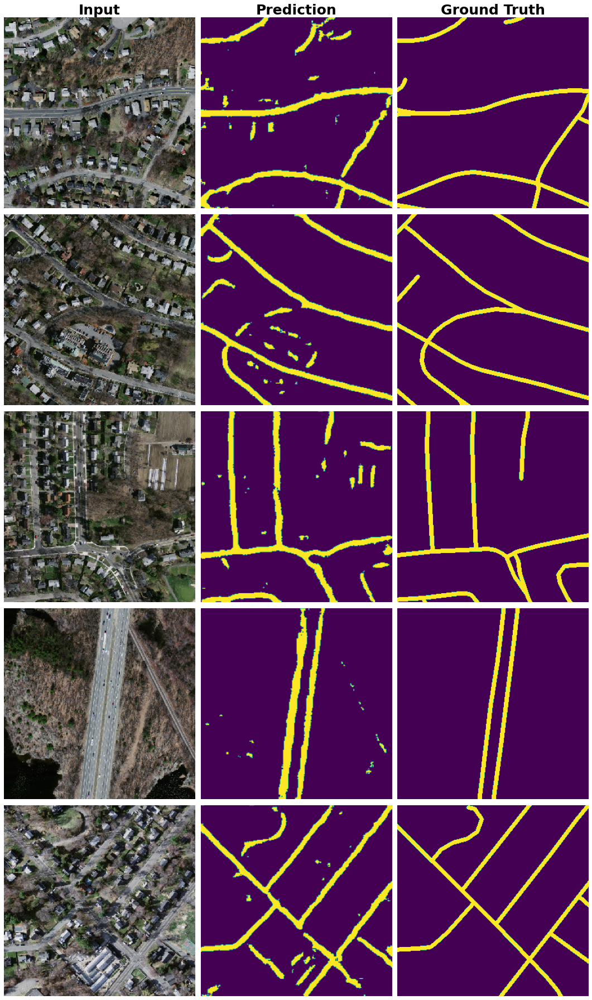

In [ ]:
visualize_predictions(test_data_dir, out_dir, n=5)

In case you want to view all the predictions of my model in one place as folder:

[Go to this drive link I have shared](https://drive.google.com/drive/folders/1LU7eNy5s2t8b7UJKKD6EAafrqCbyXQNn?usp=sharing)

Note that the predictions are made on 300x300 regions individually. It will be extremely trivial to stich them together to form the original set of 1500x1500 images, that is something I am not going to do in this notebook.

## Conclusion

I performed the segmentation of roads from satellite imagery. To avoid loosing details, I took the approach of tiling our images into smaller cells instead of resizing them. Then I used U-net architecture with a weighted binary croentropy loss to segment our images. I achieved the following metrics on our test set:

| metric | value on test set |
| --- | :---: |
| accuracy | 93% |
| IOU | 94% |
| Precision | 68% |
| Recall | 70% |

The results on the test set are show that the algorithm does a good job in this challenging task. After viewing the predicted images, it can be said that the performance is comparable to that of a human being looking at those images. Note that the model also struggles in recognizng roads which are occluded behind trees and buildings etc.

### Further directions
The current architecture was not so deep and I could not spend as much time in training and experimenting as I would have liked to do, due to poor resources. A deeper U-net architecture can be used with a more advanced loss such as focal loss. This might help improve the results further.

# Thanks for reading!